In [6]:
# download separate files representing each city and concatenate them

In [2]:
import pandas as pd
pd.set_option('display.max_columns', 300)  
pd.set_option('display.max_rows', 10)

import os
import seaborn as sns


Dataset:
- 244K rows
- 89 columns

In [3]:
path = '../data/'
df = pd.read_csv(os.path.join(path,'airbnb_listings_usa_cycle_1.csv'))
df.shape

Tip: Sometimes export dataset to Excel such that eyeballing observations is easier.

Pre-processing: data consistency checks

In [10]:
# Checks if all prices begin with a '$' sign
# df.price.apply(lambda x: x[:1]).unique()

# df.dtypes


In [11]:
df['price'] = df['price'].apply(lambda x: float(x[1:].replace(",","")))

City information is incorrectly or inconsistently populated. We need a column to align the information to the metroplitain areas corresponding to the cities. e.g. Georgetown, Pflugerville, and Austin show up in seraches for Austin. Let's classify them as Austin.

We'l call this 'metro_area'

Here are the metro areas: Cities covered: Asheville, Athens, Austin, Boston, Broward, Cambridge, Chicago,Clark County, Columbus, Denver, Hawaii, Jersey City, Los Angeles, Nashville, New Orleans, New York City, Oakland, Portland, Rhode Island, Salem OR, San Diego, San Francisco, San Mateo, Santa Clara, Santa Cruz, Seattle, Twin Cities, Washington DC

Rules 
(1) There is only one metro area per state. We can rely on the state column to populate metro area
(2) For remaining filter in the order of the widest net cast. e.g. CA has many metro areas. assign san francisco, los angeles,... and you have fewer rows to apply logic.

...
(n) Exceptions: apply manual fix: trade-off. tactical vs strategic.

** 99% rows processed ~2K rows filtered out




In [12]:
# Subset columns that are relevant
location_columns = ['host_location','host_neighbourhood','street','neighbourhood','neighbourhood_cleansed','city','state','zipcode','market','smart_location']

In [13]:
# States where there is only one metro area per state, in our dataset
df.loc[df['state']=='TX','metro_area']='Austin'
df.loc[df['state']=='NC','metro_area']='Asheville'
df.loc[df['state']=='GA','metro_area']='Athens'
df.loc[df['state']=='FL','metro_area']='Broward'
df.loc[df['state']=='IL','metro_area']= 'Chicago'
df.loc[df['state']=='NV','metro_area']='Clark CO'
df.loc[df['state']=='OH','metro_area']='Columbus'
df.loc[df['state']=='CO','metro_area']='Denver'
df.loc[df['state']=='HI','metro_area']='Hawaii'
df.loc[df['state']=='NJ','metro_area']='Jersey City'
df.loc[df['state']=='TN','metro_area']='Nashville'
df.loc[df['state']=='LA','metro_area']='New Orleans'
df.loc[df['state']=='NY','metro_area']='New York City'
df.loc[df['state']=='RI','metro_area']='Rhode Island'
df.loc[df['state']=='WA','metro_area']='Seattle'
df.loc[df['state']=='MN','metro_area']='Twin Cities'
df.loc[df['state']=='DC','metro_area']='Washington DC'

In [14]:
# States where there are multiple metro areas per state (e.g. CA has LA-area, SD, SF, etc.)

condition_SF = (df['metro_area'].isnull() & (df['state']=='CA') & (df['city'].str.contains('San Francisco')))
condition_SanDiego = ((df['metro_area'].isnull()) & (df['state']=='CA') & (df['city'].isin(['La Jolla','Chula Vista','Santa Cruz','San Diego'])))
condition_Oakland = ((df['metro_area'].isnull()) & (df['state']=='CA') & (df['city'].str.contains('Oakland')))
condition_LA = ((df['metro_area'].isnull()) & (df['state']=='CA') & (df['city'].isin(['Los Angeles','Long Beach','Santa Monica','West Hollywood','Arcadia', 'Aan Gabriel', 'Topanga', 'Venice', 'Hawthorne', 'Hacienda Heights', 'Beverly Hills','Pasadena','Glendale','Marina del Rey','Inglewood','Malibu','Redondo Beach','Burbank','Torrance','Rowland Heights','Culver City','Aptos','Monterey Park','Alhambra','San Gabriel','Altadena','Manhattan Beach','Hermosa Beach','Temple City','Santa Clarita','Walnut'])))
condition_Cambridge = ((df['metro_area'].isnull()) & (df['state']=='MA') & (df['neighbourhood'].str.contains('Cambridge')))
condition_Boston = ((df['metro_area'].isnull()) & (df['state']=='MA') & (df['neighbourhood'].str.contains('Cambridge')==False))
condition_SantaClara = ((df['metro_area'].isnull()) & (df['state']=='CA') & (df['city'].isin(['San Jose','Sunnyvale', 'Santa Clara','Cupertino','Aptos','Milpitas','Palo Alto','Mountain View','Pacific Grove', 'Los Gatos'])))
condition_SalemOR = ((df['metro_area'].isnull()) & (df['state']=='OR') & (df['city']=='Salem'))
condition_Portland = ((df['metro_area'].isnull()) & (df['city'].isin(['Portland'])))
condition_LA_2 = ((df.metro_area.isnull()) & (df.market=='Los Angeles'))

In [15]:
df.loc[df['state']=='Tx','metro_area']='Austin'
df.loc[condition_Cambridge, 'metro_area'] = 'Cambridge'
df.loc[condition_Boston, 'metro_area'] = 'Boston'
df.loc[condition_LA, 'metro_area'] = 'Los Angeles'
df.loc[condition_LA_2, 'metro_area'] = 'Los Angeles'
df.loc[condition_SF, 'metro_area'] = 'San Francisco'
df.loc[condition_SanDiego, 'metro_area'] = 'San Diego'
df.loc[condition_Oakland, 'metro_area'] = 'Oakland'

df.loc[condition_SantaClara, 'metro_area'] = 'Santa Clara'

df.loc[condition_Portland,'metro_area'] = 'Portland'
df.loc[condition_SalemOR,'metro_area'] = 'Salem'



In [16]:
# Updated dataframe to exclude null metro areas
df = df[df.metro_area.isnull()==False]

We observe unpopulated values where we expected there to be, because of inconsistent values in columns. Trade-off between qiuck fix vs pandas fix.

Quick fix: gets it done within a known time. If you'd like to show results immediately. cost: it's not repeatable. A code fix can be applied to same patterns
of data inconsistency going forward.

Some columns are widly inconsistent with others where you'd have to deem it un-usable. Drop it from dataset.

Lots of Los Angeles area cities are not coded explicitly as Los Angeles. This is explainable since people refer to those areas by their county names. And also since the prestige of a neighborhood in the sprawl of LA-area neighborhoods drive premium.

### Descriptive Statistics

Distribution of target

In [18]:
# target variable - prices
df.price.describe()

count    241172.000000
mean        242.893474
std         706.317122
min           0.000000
25%          75.000000
50%         125.000000
75%         210.000000
max       94016.000000
Name: price, dtype: float64

Detecting outliers

We are not excluding outliers just yet. But large outliers distort the ability of charts to interpret visual information. So we can exclude these outliers from the inputs to these charts.

In [19]:
df.price.quantile(.9),df.price.quantile(.95),df.price.quantile(.98),df.price.quantile(.99),df.price.quantile(.995),df.price.quantile(.999)

(400.0, 650.0, 1130.0, 2000.0, 3951.159999999916, 10000.0)

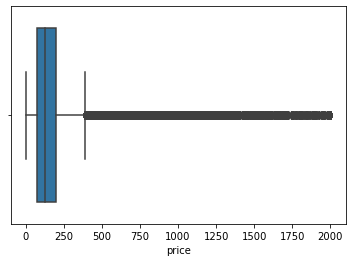

In [20]:
# Including 99% of homes
sns.boxplot(x=df[df.price<=2000]['price'])

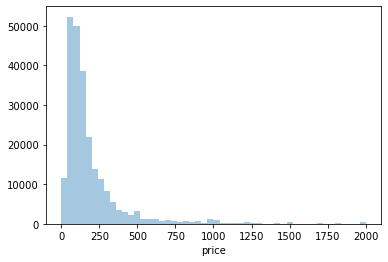

In [21]:
sns.distplot(df[df.price<=2000]['price'], kde=False)

# we observe a large outlier which limits our ability to examine the data

Now separate these by metro areas? I think the outliers tend to clustered around major metropolitain areas. We can begin examining other trends as well.

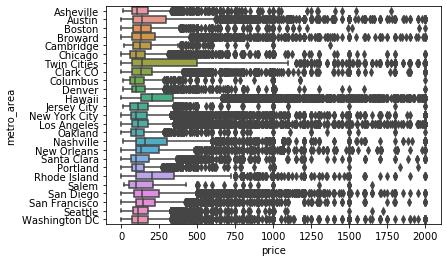

In [22]:
# Including 99% of homes
sns.boxplot(y=df['metro_area'], x=df[df.price<=2000]['price'])

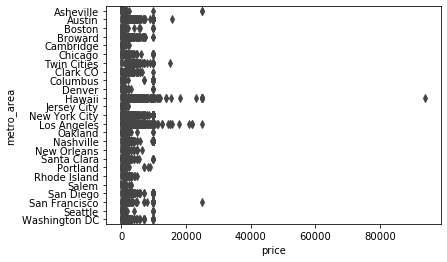

In [23]:
# Including all homes
sns.boxplot(y=df['metro_area'], x=df['price'])

grouping the boxplot doesn't give us visibility into the distribution of non-outliers. let's narrow down to 95%?

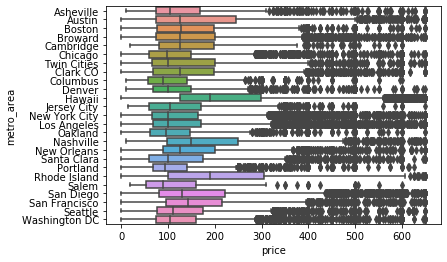

In [19]:
sns.boxplot(y=df['metro_area'], x=df[df.price<=df.price.quantile(.95)]['price'])

Now let's look at other categories

In [24]:
# what are the other categories or numeric categorical measures (e.g. bedrooms)
df.describe(include='all')

,Unnamed: 0,id,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,name_len,summary_len,space_len,description_len,neighborhood_overview_len,notes_len,transit_len,access_len,interaction_len,house_rules_len,host_about_len,metro_area
count,241172.000000,2.411720e+05,240919,240376,170568,170568,201407,240919,179505,240919.000000,240919.000000,241172,240919,240919,241172,195745,241172,119579,241018,241169,239381,240826,241172,241172,241172,241172.000000,241172.000000,241172,241172,241172,241172.00000,240974.000000,240760.000000,239501.000000,241144,241172,2082.000000,241172.000000,19488,17296,182500,207336,241172.00000,241172,2.411720e+05,2.411720e+05,241172,241172.000000,241172.000000,241172.00000,241172.00000,241172,241172.000000,241172.000000,191756,191756,189061.000000,188830.000000,188850.000000,188773.000000,188835.000000,188763.000000,188756.000000,241172,144682,241172,241172,241172,241172,241172,241172.000000,241172.000000,241172.000000,241172.000000,191756.00000,241172.000000,241172.000000,241172.000000,241172.000000,241172.000000,241172.000000,241172.000000,241172.000000,241172.000000,241172.000000,241172.000000,241172
unique,NaN,NaN,4136,4897,4,98,99,2,2424,NaN,NaN,879,2,2,1529,1311,1449,34,1481,28,1880,90,1529,1,1,NaN,NaN,2,49,4,NaN,NaN,NaN,NaN,5,213699,NaN,NaN,1347,1566,488,784,NaN,140,NaN,NaN,1,NaN,NaN,NaN,NaN,25,NaN,NaN,3614,2295,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,63,2,1,10,2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25
top,NaN,NaN,2015-11-02,"New York, New York, United States",within an hour,100%,100%,f,Williamsburg,NaN,NaN,"['email', 'phone']",t,f,"New York, NY, United States",Brooklyn,Unincorporated Areas,Manhattan,New York,CA,96815,New York,"New York, NY",US,United States,NaN,NaN,t,Apartment,Entire home/apt,NaN,NaN,NaN,NaN,Real Bed,{},NaN,NaN,$500.00,"$3,000.00",$0.00,$100.00,NaN,$0.00,NaN,NaN,t,NaN,NaN,NaN,NaN,2020-06-09,NaN,NaN,2020-01-01,2020-03-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,"{""City of Los Angeles"","" CA""}",f,f,strict_14_with_grace_period,f,f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New York City
freq,NaN,NaN,1524,34478,115889,122884,70443,156808,3276,NaN,NaN,20146,240325,142904,22216,11010,9100,21954,22216,68008,3683,51999,22216,241172,241172,NaN,NaN,228553,93284,163267,NaN,NaN,NaN,NaN,239130,445,NaN,NaN,761,669,70306,15486,NaN,135250,NaN,NaN,241172,NaN,NaN,NaN,NaN,57816,NaN,NaN,590,6649,NaN,NaN,NaN,NaN,NaN,NaN,NaN,149853,21285,129153,241172,104892,236918,235452,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,49509
mean,121375.035879,2.487219e+07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52.937294,52.937294,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,35.730168,-102.660053,NaN,NaN,NaN,3.96687,1.429358,1.522628,2.131336,NaN,NaN,905.340

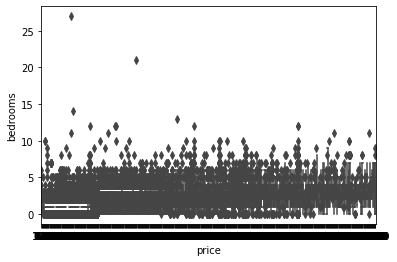

In [27]:
sns.boxplot(y=df['bedrooms'], x=df[df.price<=df.price.quantile(.95)]['price'])

it looks like the bedrooms are not as cleanly distributed to produce a neat diagram. let's filter out the places that have more than 5-6 bedrooms?

Additionally there is a long tail of listings with large numberof bedrooms, and beds. When describig the data let's group together the extremely large observations.

In [24]:
# pd.set_option('display.max_rows', 100)  
# df.bedrooms.value_counts()

So it turns out if you want to group the boxplots by bedrooms, bedrooms has to be a non-numerical feature:

In [26]:
mapping = {0:'0',1:'1',2:'2',3:'3',4:'4',5:'5',6:'6'}
df['bedrooms_str'] = df[df['bedrooms']<7].bedrooms.apply(lambda x: mapping[x])

In [27]:
df[df['bedrooms']<7].bedrooms.value_counts()

1.0    132344
2.0     48990
3.0     22649
0.0     22033
4.0      9509
5.0      3268
6.0      1088
Name: bedrooms, dtype: int64

In [28]:
condition_7BedroomsPlus = (df['bedrooms']>=7)
df.loc[condition_7BedroomsPlus, 'bedrooms_str'] = '7+'

In [29]:
df.bedrooms_str.value_counts()

1     132344
2      48990
3      22649
0      22033
4       9509
5       3268
6       1088
7+       879
Name: bedrooms_str, dtype: int64

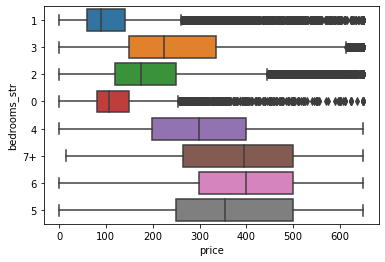

In [30]:
sns.boxplot(y=df.bedrooms_str,x=df[df.price<=df.price.quantile(.95)]['price'])

Now let's do a similar exercise with bedrooms.

In [31]:
pd.set_option('display.max_rows', 100)  
df.beds.quantile(.99),df.bedrooms.quantile(.99)

(9.0, 5.0)

In [32]:
mapping = {0:'0',1:'1',2:'2',3:'3',4:'4',5:'5',6:'6',7:'7',8:'8',9:'9'}
df['beds_str'] = df[df['beds']<10].beds.apply(lambda x: mapping[x])
condition_10BedsPlus = (df['beds']>=10)
df.loc[condition_10BedsPlus, 'beds_str'] = '10+'

In [33]:
df.beds_str.value_counts()

1      107871
2       59525
3       29579
4       17730
5        7653
0        6444
6        4356
7        2104
10+      1959
8        1519
9         761
Name: beds_str, dtype: int64

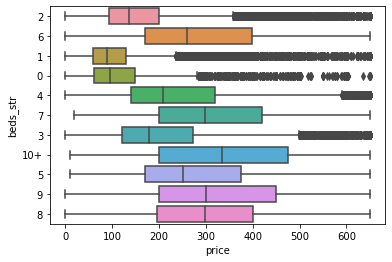

In [34]:
sns.boxplot(y=df.beds_str,x=df[df.price<=df.price.quantile(.95)]['price'])

Now, let's pur ourselves in the shoes of a prospective renter. which variables matter the most.

Let me be neutral and pick a city I am least aware of. Let's say Ft. Lauderdale / Broward county.
Pick dates far out so the rates are not sensitive to how close the booking is to today. And not a holiday period. We can't control for Covid.

experience: 
- convert to USD rate from INR. I wonder if different rates are quoted based on region. assume that all prices
- close to beach
- i prefer instant book.
- *** image, image, image!!!
- rating & number of reviews
- supply & demand and availability close to booking. [let's leave this out for now...]
- phrasing of location
- for dense cities, access to public transportation. for broward, i'd expect there to be nothing. and i'd rent a car. 


let's look at other columns. scan left to right.

my own heuristic model bias: let me call this "jasim's baseline": 

what matters:
host_response_time - for last minute travelers
host_response_rate - for last minute travelers
host_has_profile_pic
instantly bookable
(rating??) all else equal....

(ok host_% features missing for 16%)

*** do we differentiate by property_type??
*** do differentite by room_type: separate models for 

pricing - how does price breakdown - security_depost, cleaning_fee, extra_people affect purchasing behavior

- neighborhood is baked into the location that

** "outcome dependent outcome" -> leakage? you're trying to maximize price which strongly correlates with rating, a higher value of which allows you to price higher, which.....
shall we also look at variability of predictions?



* ideas: cute or white female might be more attractive


In [36]:

df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 241172 entries, 0 to 243678
Data columns (total 89 columns):
 #   Column                                        Non-Null Count   Dtype  
---  ------                                        --------------   -----  
 0   Unnamed: 0                                    241172 non-null  int64  
 1   id                                            241172 non-null  int64  
 2   host_since                                    240919 non-null  object 
 3   host_location                                 240376 non-null  object 
 4   host_response_time                            170568 non-null  object 
 5   host_response_rate                            170568 non-null  object 
 6   host_acceptance_rate                          201407 non-null  object 
 7   host_is_superhost                             240919 non-null  object 
 8   host_neighbourhood                            179505 non-null  object 
 9   host_listings_count                           24

Ship it!!!! "Don't let the enemy be the perfect of the good, haha"!! Run it. Get a baseline. come back! 

In [70]:
# There is an inconsistent datatype. "binary search for it"

# sum(df.neighbourhood_cleansed) # Error!
# sum(df.neighbourhood_cleansed[0:100000]) # Error!
# sum(df.neighbourhood_cleansed[0:50000]) # Error!
# sum(df.neighbourhood_cleansed[0:20000]) # Error!
# sum(df.neighbourhood_cleansed[0:10000]) # Error!
# sum(df.neighbourhood_cleansed[0:5000]) # No error
# sum(df.neighbourhood_cleansed[9950:9955]) #Error
df.neighbourhood_cleansed[9950:9955]
int(df.neighbourhood_cleansed[9950])



9952    78721
9953    78741
9954    78757
9955    78705
9956    78741
Name: neighbourhood_cleansed, dtype: object

I've spent too much time custom profiling. There are too many fields to look at. Let me make my job easier by using Pandas Profiling!

No time to chase the past 1%. Pareto law. Filter out now and revisit.

In [42]:
from pandas_profiling import ProfileReport
# profile = ProfileReport(df, minimal=True).to_notebook_iframe()
profile = ProfileReport(df, minimal=True).to_file('pandas_profile.html')

# profile

High cardinality features -> Why does pandas profiling give warnings for numeric features? e.g. host response rate: 99 distinct values?



Strategy

Baseline: mean
Jasim's baseline: multiple regression model with selected dependent variables. 

1. linear regression
2. decision tree
3. ensemble

-- go into pricing models

4. neural network

stretch goal: the google airline algo recommendation!!!




.... Which makes me think and realize. This is a case of an integer that appears like an numeric variable that is actually cagtegorical. So the dattype is misleading. That is why pandas profiles applies cardinality to both integers and non-integers. To be fail-safe let's convert all zipcodes to strings.

In [106]:
# fix unsupported types

df['zipcode'] = df['zipcode'].apply(lambda x: str(x))



In [99]:
df['neighbourhood_cleansed'].value_counts(dropna=False) 

Unincorporated Areas    9100
Hollywood               4706
Primary Urban Center    4524
Hennepin                3989
Williamsburg            3751
                        ... 
Gerritsen Beach            1
Stevenson Ranch            1
Rickenbacker               1
Columbia Gardens           1
Iveywood                   1
Name: neighbourhood_cleansed, Length: 1397, dtype: int64

Issue: zipcodes are embedded into the neighbourhood feature. Impute it from non numeric values in neighborhoods feature which have a matching zipcode.

In [102]:
# # Deferred: cleaning out bad values in neighbourhood_cleansed
# condition = df['neighbourhood_cleansed'].apply(lambda x: True if type(x) is int else False )
# zipcodes = df[condition]['neighbourhood_cleansed'].unique()
# zipcode_neighbourhood_lu = df[df['zipcode'].isin(zipcodes)  & (df['neighbourhood'].isnull() == False)][['zipcode','neighbourhood']]
# zipcode_neighbourhood_lu.head()

# Filtering out a data quality erorr that cannot be fixed in time
df = df[condition==False]


Now let's pandas profile

In [114]:
from pandas_profiling import ProfileReport
# profile = ProfileReport(df, minimal=True).to_notebook_iframe()
profile = ProfileReport(df, minimal=True).to_file('pandas_profile_v2.html')

# profile

Export report to file: 100%|██████████| 1/1 [00:00<00:00, 114.39it/s]


In [113]:
df.zipcode.iloc[2]

'78704.0'

In [115]:
df.to_csv('airbnb_listings_usa_cycle_1.csv')